# 1. Imports

In [94]:
import torch 
import torchvision
import fastai.vision.all
import matplotlib.pyplot as plt
import requests 

# 2. CAM의 구현을 위한 학습

## A. DLS

In [104]:
path = fastai.data.external.untar_data(fastai.data.external.URLs.PETS)
fnames = [l for l in (path/'images').ls() if str(l).split('.')[-1] == 'jpg']

In [108]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [109]:
dls = fastai.vision.data.ImageDataLoaders.from_name_func(
    path = path/'images',
    fnames = fnames,
    label_func = label_func,
    valid_pct = 0.2,
    item_tfms = fastai.vision.augment.Resize(512),
    bs = 32
)

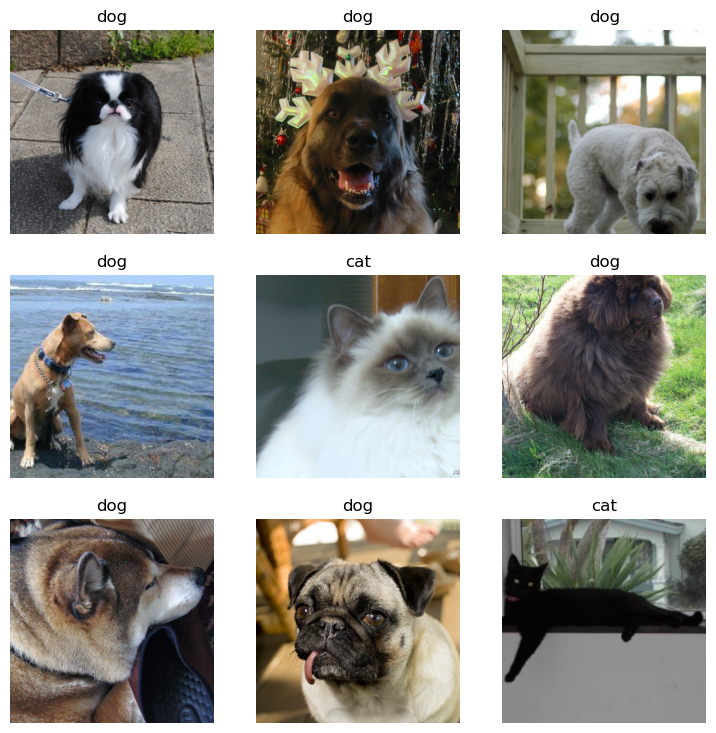

In [111]:
dls.show_batch()

## B. 이미지 자료 불러오기

`-` torchvision 사용

In [154]:
x = torchvision.io.read_image('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
# x를 찍어보면 int형의 tensor형태로 되어있다

`-` fastai 사용

path를 이용하는 string $\to$ PILImage $\to$ fastai.torch_core.TensorImage $\to$ torch.tensor

In [156]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0]
# x를 찍어보면 float형의 tensor형태로 되어있다

## C. 이미지 시각화

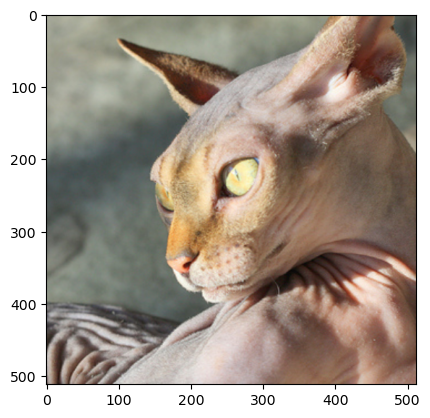

In [162]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0] 
plt.imshow(torch.einsum('ocij -> ijc' , x.to('cpu'))) # cuda에 있으면 시각화가 안 됨

`-` 아무런 사진이나 하나 가져와서 시각화 해보기

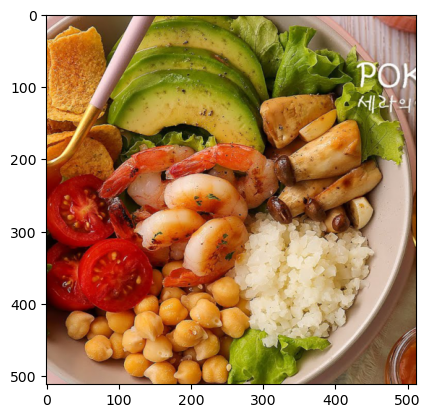

In [176]:
x_pil = fastai.vision.core.PILImage.create(requests.get('https://i.ytimg.com/vi/vc0aaS83cRo/maxresdefault.jpg').content)
x = next(iter(dls.test_dl([x_pil])))[0]
plt.imshow(torch.einsum('ocij -> ijc' , x.to('cpu')))

iamge가 잘리는 이유 : dls에서 그림의 size를 512로 정해놨기때문에 512 x 512 image로 출력된다

## D. AP layer

In [179]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
ap

AdaptiveAvgPool2d(output_size=1)

In [181]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4)*1.0 
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [183]:
ap(X) #채널별로 평균을 구해줌

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

In [186]:
r,g,b = ap(X)[0]

In [187]:
r, g ,b

(tensor([[7.5000]]), tensor([[23.5000]]), tensor([[39.5000]]))

## E. AP,Linear의 교환 (Linear는 행렬곱이다)

In [188]:
ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

tensor([[17.3000]])

In [189]:
ap(r*0.1 + g*0.2 + b*0.3)

tensor([[17.3000]])

`-` 똑같은데요?

위와 같은 과정을 Linear를 태울 때 l.weight와 같이 가중치를 적용하여서 합한다고 생각할 수 있다.

l.weight.data = [0.1,0.2,0.3] 로 놓으면 생각하기가 조금 쉽다

In [201]:
flttn = torch.nn.Flatten()
l = torch.nn.Linear(3,1,bias=False)
l.weight.data = torch.tensor([[0.1,0.2,0.3]]) # 행렬계산이기에 2차원 배열로 해야함

우리가 쉽게 생각할 수 있는 1번째 방법

In [212]:
l(flttn(ap(X)))

tensor([[17.3000]], grad_fn=<MmBackward0>)

Linear와 ap의 교환

In [222]:
flttn(ap(torch.einsum('ocij,kc -> okij' , X , l.weight.data)))

tensor([[17.3000]])

`!` Linear는 가중치를 곱해서 더하는 과정 즉, 행렬곱으로 이해하는 것이 좋다.

# 5. CAM

## A. 1단계 - 이미지분류 잘하는 네트워크 선택 후 학습

In [224]:
lrnr = fastai.vision.learner.vision_learner(
    dls = dls,
    arch = fastai.vision.models.resnet34,
    metrics = [fastai.metrics.accuracy]
)

In [231]:
lrnr.fine_tune(1) #lrnr.model의 마지막 부분만 학습시키는 걸 fine_tune이라고 함

epoch,train_loss,valid_loss,accuracy,time
0,0.087281,0.012028,0.995940,00:19


epoch,train_loss,valid_loss,accuracy,time
0,0.051851,0.010260,0.996617,00:26


## B. 2단계 - 네트워크 부분 수정 후 재학습

In [233]:
net1 = lrnr.model[0]
net2 = lrnr.model[1]

In [235]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1),
    torch.nn.Flatten(),
    torch.nn.Linear(512,2,bias=False)
)

In [237]:
net = torch.nn.Sequential(
    net1,
    net2
) # 내가 만든(수정한) net

In [239]:
lrnr2 = fastai.learner.Learner(
    dls = dls,
    model = net,
    metrics = [fastai.metrics.accuracy]
) # 나만의 net으로 새롭게 학습할 lrnr2

In [241]:
lrnr.loss_func , lrnr2.loss_func # 정의하지 않아도 알아서 잘 들어가 있다

(FlattenedLoss of CrossEntropyLoss(), FlattenedLoss of CrossEntropyLoss())

In [242]:
lrnr2.fine_tune(5)

epoch,train_loss,valid_loss,accuracy,time
0,0.392073,0.295664,0.876861,00:26


epoch,train_loss,valid_loss,accuracy,time
0,0.192747,0.190745,0.916779,00:26
1,0.180415,0.234511,0.912720,00:26
2,0.136703,0.168526,0.926252,00:26
3,0.057196,0.052161,0.975643,00:26
4,0.033394,0.049159,0.979702,00:26


## C. 3단계 - 수정된 net2에서 linear 와 AP의 순서를 바꿈

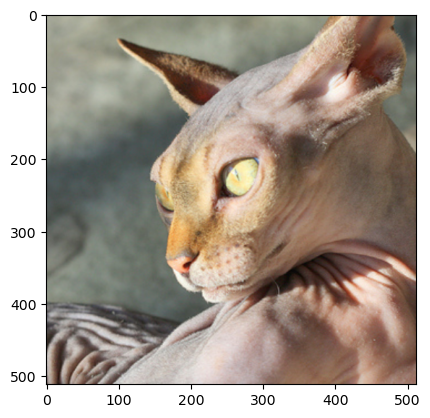

In [243]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0]
x_dec = dls.decode([x])[0]
plt.imshow(torch.einsum('ocij -> ijc', x_dec))

net2 순서 바꾸기 전 네트워크 진행

In [244]:
ap = lrnr2.model[-1][0]
fl = lrnr2.model[-1][1]
l = lrnr2.model[-1][2]

In [251]:
l(fl(ap(net1(x)))) # 고양이!!

TensorImage([[ 2.5441, -2.8503]], device='cuda:0', grad_fn=<AliasBackward0>)

`-` net2 순서 바꾼 후 네트워크 진행

In [252]:
ap = lrnr2.model[-1][0]
fl = lrnr2.model[-1][1]
l = lrnr2.model[-1][2]

`1`. 일단 net1(x)을 진행

`2`. Linear를 먼저 해야하니 행렬곱

`3`. ap

`4`. flatten

In [266]:
flttn(ap(torch.einsum('ocij,kc -> okij' , net1(x) , l.weight.data))) #고양이!!!

TensorImage([[ 2.5441, -2.8503]], device='cuda:0', grad_fn=<AliasBackward0>)

`-` 그런데 왜 순서 바꾸는 거지..? 그냥 하면 안돼?

`-` 순서를 바꾸면 데이터의 차원이 [1,2,?,?] 이런식으로 바뀌는데 2인 부분을 고양이 or 강아지 이런식으로 데이터를 바라볼 수 있다

### EXTRA. 잠깐... 인공지능이 뭘 보고 고양이인지 강아지인지 구분하는 거지?

In [277]:
WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
WHY[0,0,:,:].int()

TensorImage([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1, -2],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  3, 11, 16, 12,  4,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  7, 26, 39, 29,  9,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  9, 34, 53, 37, 10,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  7, 27, 39, 28,  9,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0, -1,  3, 10, 15, 10,  3,  1,  1,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  2,  4,  4,  2,  0,  0,  0,  0,  1,  0],
             [ 0,  0,  0,  0,  0,  0,  4,  6,  8,  3,  0,  0,  1,  1,  1,  1],
             [ 0,  0,  0,  0,  1,  1,  2,  8, 11,  4

`-` 가운데 쪽에 숫자들이 크다. 저 의미는 인공지능이 그림의 저 부분을 보고 고양이라고 판단했다는 의미

In [342]:
WHY[0,1,:,:].int()

TensorImage([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                1,   1,   0],
             [  0,   0,   0,   0,   0,   0,   3,   8,   5,   1,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,  -3,  -9,  -8,   6,   5,   1,   0,   2,   3,
                1,   0,   0],
             [  0,   0,   0,  -1, -14, -42, -59, -42, -15,  -1,   0,   7,   4,
                0,   0,   0],
             [  0,   0,   0,  -2, -20, -65, -97, -72, -25,  -3,   0,   1,   1,
                0,   0,   0],
             [  0,   0,   0,  -2, -21, -64, -93, -71, -28,  -4,  -1,   0,   0,
                0,   0,   0],
             [  0, 

`-` 가운데 쪽에 숫자들이 작다. 저 의미는 인공지능이 그림의 저 부분을 보고 고양이가 아니라고 판단했다는 의미

시각화 해보자

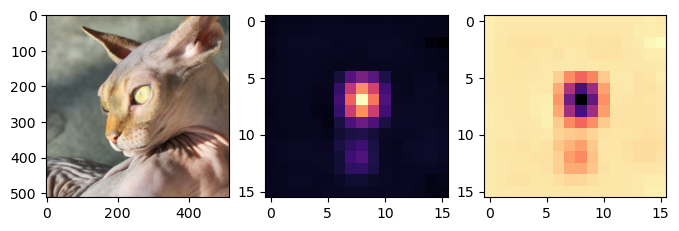

In [292]:
WHYCAT = WHY[0,0,:,:].to('cpu').detach()
WHYDOG = WHY[0,1,:,:].to('cpu').detach()
x_dec = dls.decode([x])[0]
fig , ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYCAT , cmap='magma')
ax[2].imshow(WHYDOG , cmap='magma')

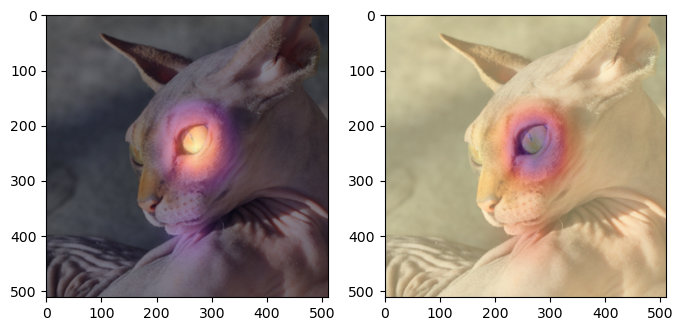

In [297]:
fig ,ax = plt.subplots(1,2,figsize=(8,6))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[0].imshow(WHYCAT , cmap='magma',extent = (0,511,511,0) , interpolation = 'bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYDOG , cmap='magma',extent = (0,511,511,0) , interpolation = 'bilinear',alpha=0.5)

`-` 주로 눈을 보면서 고양이라고 판단하고 (1번째 그림의 해석) 주로 눈을 보면서 강아지가 아니라고 판단했다(2번째 그림의 해석)

`-` 하니로 해보자

In [305]:
x_pil = fastai.vision.core.PILImage.create(requests.get('https://github.com/guebin/DL2024/blob/main/imgs/01wk-hani1.jpeg?raw=true').content)
x = next(iter(dls.test_dl([x_pil])))[0]
x_dec = dls.decode([x])
WHY = torch.einsum('ocij,kc -> okij', net1(x), l.weight.data)
WHYCAT = WHY[0,0,:,:].to("cpu").detach()
WHYDOG = WHY[0,1,:,:].to("cpu").detach()
softmax = torch.nn.Softmax(dim=1)
cat_prob, dog_prob = softmax(flttn(ap(WHY))).to("cpu").detach().tolist()[0]

Text(0.5, 1.0, 'dog prob = 0.999923')

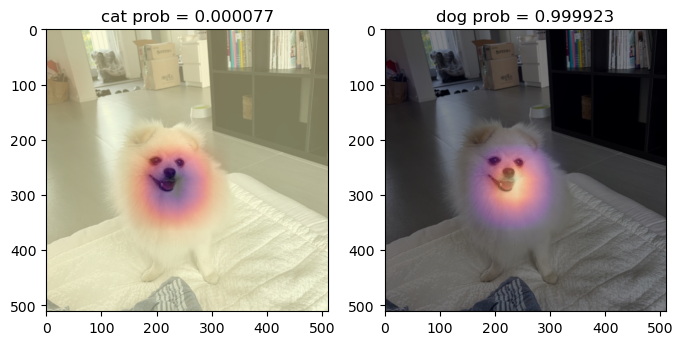

In [306]:
fig ,ax = plt.subplots(1,2,figsize=(8,6))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[0].imshow(WHYCAT , cmap='magma',extent = (0,511,511,0) , interpolation = 'bilinear',alpha=0.5)
ax[0].set_title(f'cat prob = {cat_prob:.6f}')
ax[1].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYDOG , cmap='magma',extent = (0,511,511,0) , interpolation = 'bilinear',alpha=0.5)
ax[1].set_title(f'dog prob = {dog_prob:.6f}')

## D. 4단계 - CAM 시각화 

`-` 0~25번 사진

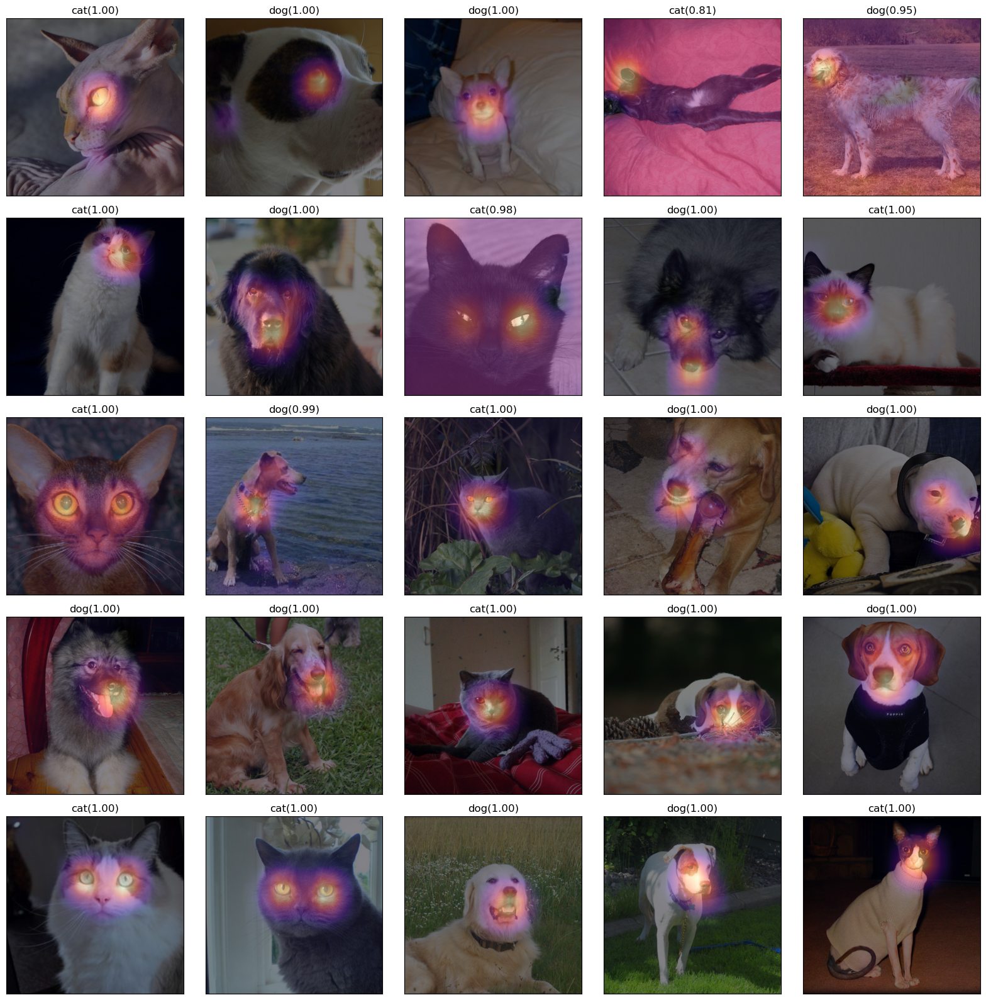

In [339]:
fig,ax = plt.subplots(5,5)
k = 0
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fnames[k])
        x = next(iter(dls.test_dl([x_pil])))[0]
        x_dec = dls.decode([x])
        WHY = torch.einsum('ocij,kc -> okij', net1(x), l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flttn(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob:
            ax[i][j].imshow(torch.einsum('ocij -> ijc', x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
        else:
            ax[i][j].imshow(torch.einsum('ocij -> ijc', x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f'dog({dog_prob:.2f})')
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
        k = k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

`-` 26~50번 사진

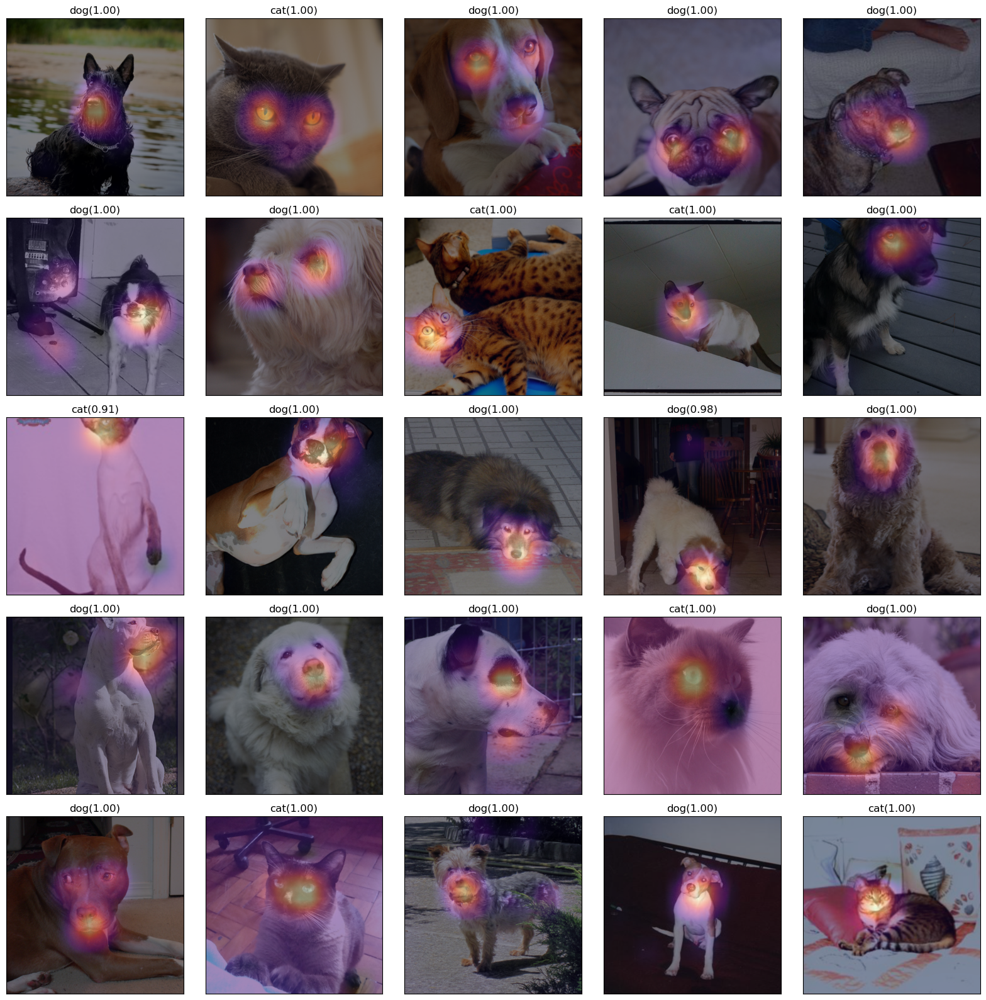

In [341]:
fig,ax = plt.subplots(5,5)
#---#
k=25
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fastai.data.transforms.get_image_files(path/'images')[k])
        x = next(iter(dls.test_dl([x_pil])))[0] # 이걸로 WHY를 만들어보자. 
        x_dec = dls.decode([x])[0] # 이걸로 시각화 
        WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flttn(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
        else: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"dog({dog_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        k=k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout() 

#### `중요` WHY를 만드는 과정에서 Linear는 가중치를 곱하여 더하는 행위이고 행렬곱으로 계산된다.

####  즉, einsum을 이용하여 계산해주면 된다

#### l.weight.data의 값만 바꿔준다면 다른 가중치로도 계산할 수 있다.